<a href="https://colab.research.google.com/github/LailaBulh/Programacion---Claas-Files/blob/main/practica18_263166.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Práctica 18: Ejercicios con EDA 1**

Link Github: [Practica18_LB](https://github.com/LailaBulh/Programacion---Claas-Files/blob/main/practica18_263166.ipynb)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import scipy.stats as stats


# Descripcion de los datos

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Programacion_ClassFiles/archivos_practicas/AirQuality.csv', sep= ';', decimal=',')

print('Vista previa de los datos: \n',df.head(),'\n\n')

print(df.info(),'\n\n')

### Remover columnas extras
df.drop(columns= ['Unnamed: 15',',,,,,'], inplace= True)

print('Dataframe actualizado:\n')
print(df.head(3))

Vista previa de los datos: 
          Date      Time  CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  \
0  10/03/2004  18.00.00     2.6         1360       150      11.9   
1  10/03/2004  19.00.00     2.0         1292       112       9.4   
2  10/03/2004  20.00.00     2.2         1402        88       9.0   
3  10/03/2004  21.00.00     2.2         1376        80       9.2   
4  10/03/2004  22.00.00     1.6         1272        51       6.5   

   PT08.S2(NMHC)  NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
0           1046      166          1056      113          1692         1268   
1            955      103          1174       92          1559          972   
2            939      131          1140      114          1555         1074   
3            948      172          1092      122          1584         1203   
4            836      131          1205      116          1490         1110   

      T    RH      AH  Unnamed: 15 ,,,,,  
0  13.6  48.9  0.7578          NaN   NaN  
1

In [ ]:
### Descripcion de datos

print(df.describe())

            CO(GT)  PT08.S1(CO)     NMHC(GT)     C6H6(GT)  PT08.S2(NMHC)  \
count  9357.000000  9357.000000  9357.000000  9357.000000    9357.000000   
mean    -34.207524  1048.990061  -159.090093     1.865683     894.595276   
std      77.657170   329.832710   139.789093    41.380206     342.333252   
min    -200.000000  -200.000000  -200.000000  -200.000000    -200.000000   
25%       0.600000   921.000000  -200.000000     4.000000     711.000000   
50%       1.500000  1053.000000  -200.000000     7.900000     895.000000   
75%       2.600000  1221.000000  -200.000000    13.600000    1105.000000   
max      11.900000  2040.000000  1189.000000    63.700000    2214.000000   

           NOx(GT)  PT08.S3(NOx)      NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
count  9357.000000   9357.000000  9357.000000   9357.000000  9357.000000   
mean    168.616971    794.990168    58.148873   1391.479641   975.072032   
std     257.433866    321.993552   126.940455    467.210125   456.938184   
min    -200

**Histogramas para columnas numericas**





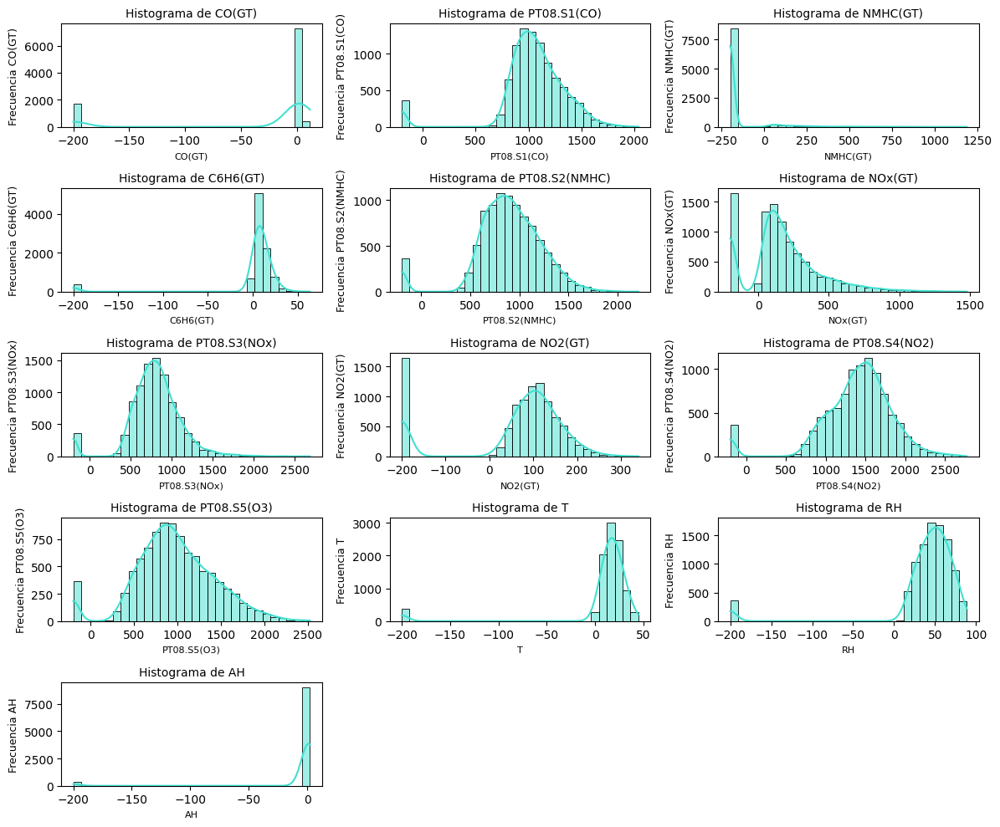

In [ ]:
columns = df.select_dtypes(include= ['int64','float64']).columns
#print(columns)

plt.figure(figsize= (12,10))

for i, col in enumerate(columns, 1):
  plt.subplot(5, 3, i)
  sns.histplot(df[col], kde= True, bins= 30, color='turquoise')
  plt.title(f'Histograma de {col}', fontsize= 10)
  plt.xlabel(col, fontsize= 8)
  plt.ylabel(f'Frecuencia {col}', fontsize= 9)

plt.tight_layout()
plt.show()


**Graficas de barras para columnas categoricas**

Comprando cambio de tipo de dato:

<class 'pandas.core.series.Series'>
RangeIndex: 9357 entries, 0 to 9356
Series name: Date
Non-Null Count  Dtype         
--------------  -----         
9357 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 73.2 KB

Frecuencia por dia:
 Day_of_week
Thursday     1344
Friday       1344
Saturday     1344
Sunday       1344
Monday       1335
Wednesday    1326
Tuesday      1320
Name: count, dtype: int64 



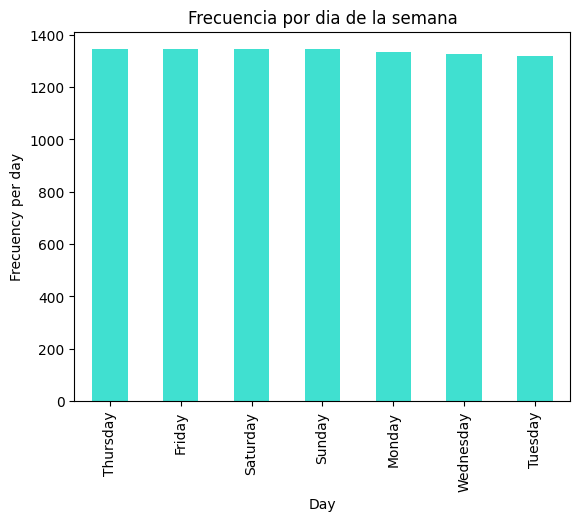

In [ ]:
### Convertir columna 'Date' de tipo object a tipo date

df['Date'] = pd.to_datetime(df['Date'], format= '%d/%m/%Y')

### Verificar correcto cambio de tipo de dato
print('Comprando cambio de tipo de dato:\n')
df['Date'].info()

### Get day
df['Day_of_week'] = df['Date'].dt.day_name()
#print('\nVista previa de columna nueva:\n',df[['Date','Day_of_week']].head())

count_days = df['Day_of_week'].value_counts()
print('\nFrecuencia por dia:\n',count_days, '\n')

count_days.plot.bar(color='turquoise')
plt.title('Frecuencia por dia de la semana')
plt.xlabel('Day')
plt.ylabel('Frecuency per day')
plt.show()

**Boxplots para identficar outliers en las columnas numericas**

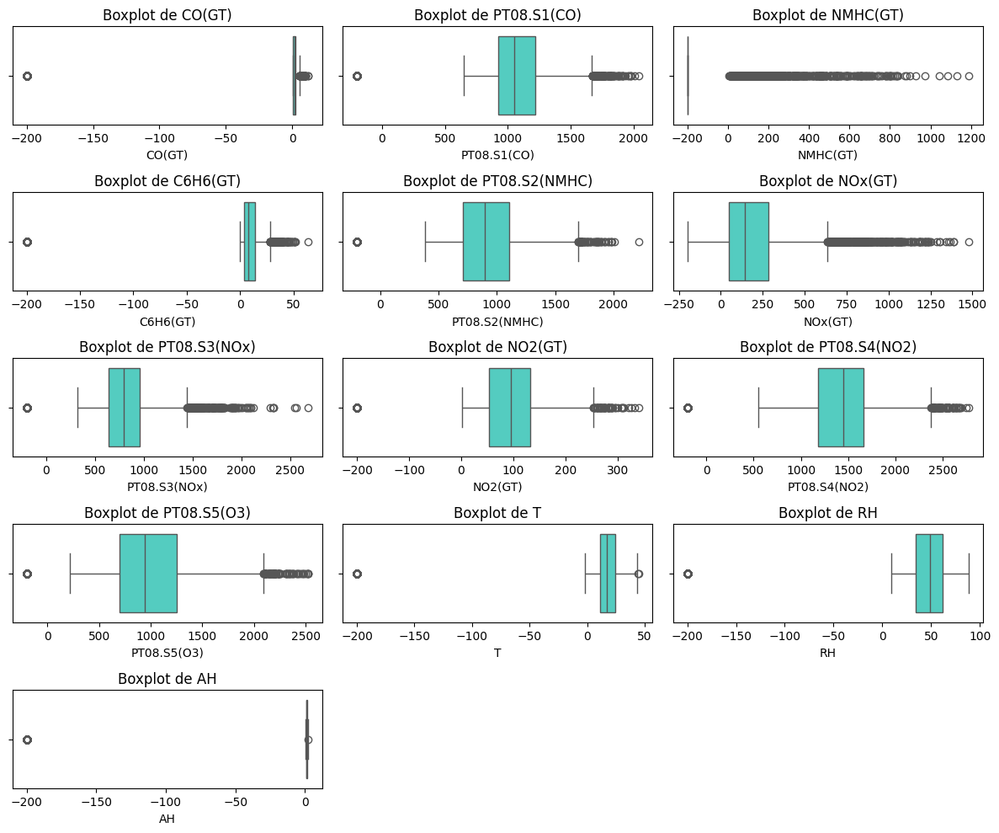

In [ ]:
plt.figure(figsize= (12,10))

for i, col in enumerate(columns, 1):
  plt.subplot(5,3,i)
  sns.boxplot(x= df[col], color='turquoise')
  plt.title(f'Boxplot de {col}')

plt.tight_layout()
plt.show()

**Matriz de correlacion y mapa de calor**

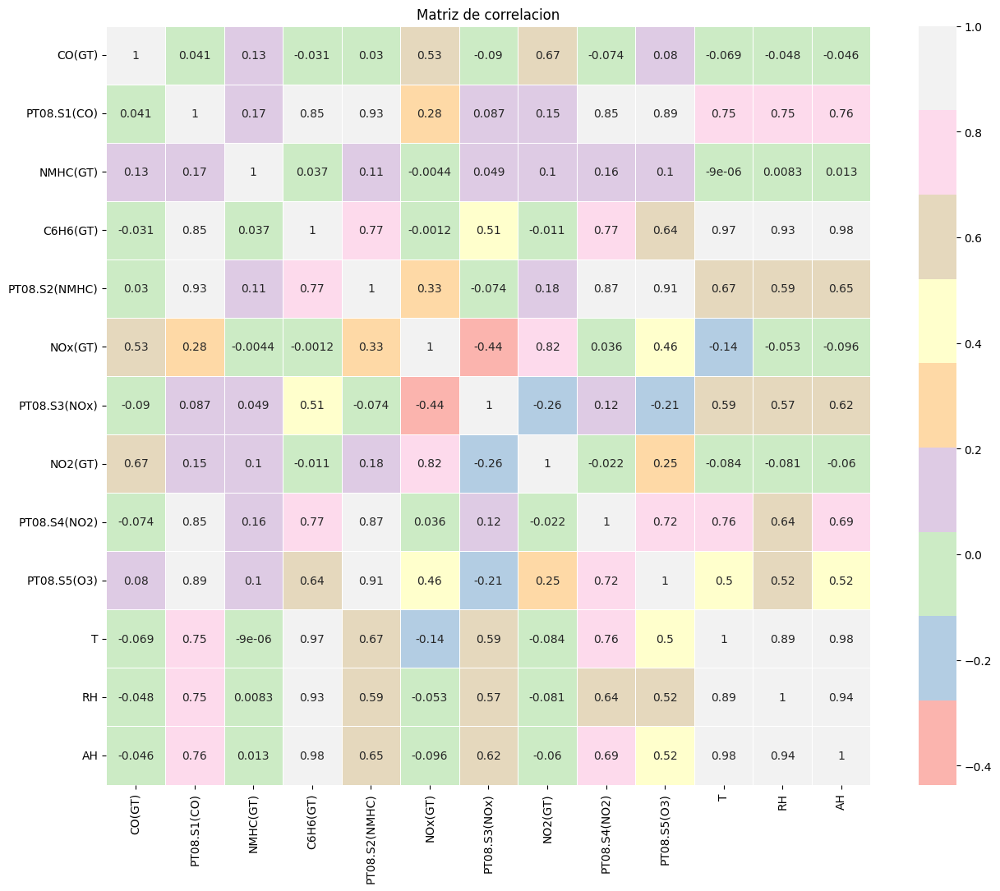

In [ ]:
#columns.to_numpy()
columns2 = df.select_dtypes(include=[np.number])

matriz_corr = columns2.corr()

plt.figure(figsize= (15,12))
sns.heatmap(matriz_corr, annot= True, cmap= 'Pastel1', linewidths= 0.5)
plt.title('Matriz de correlacion')
plt.show()

**Pairplot para visualizar relaciones entre variables numericas**

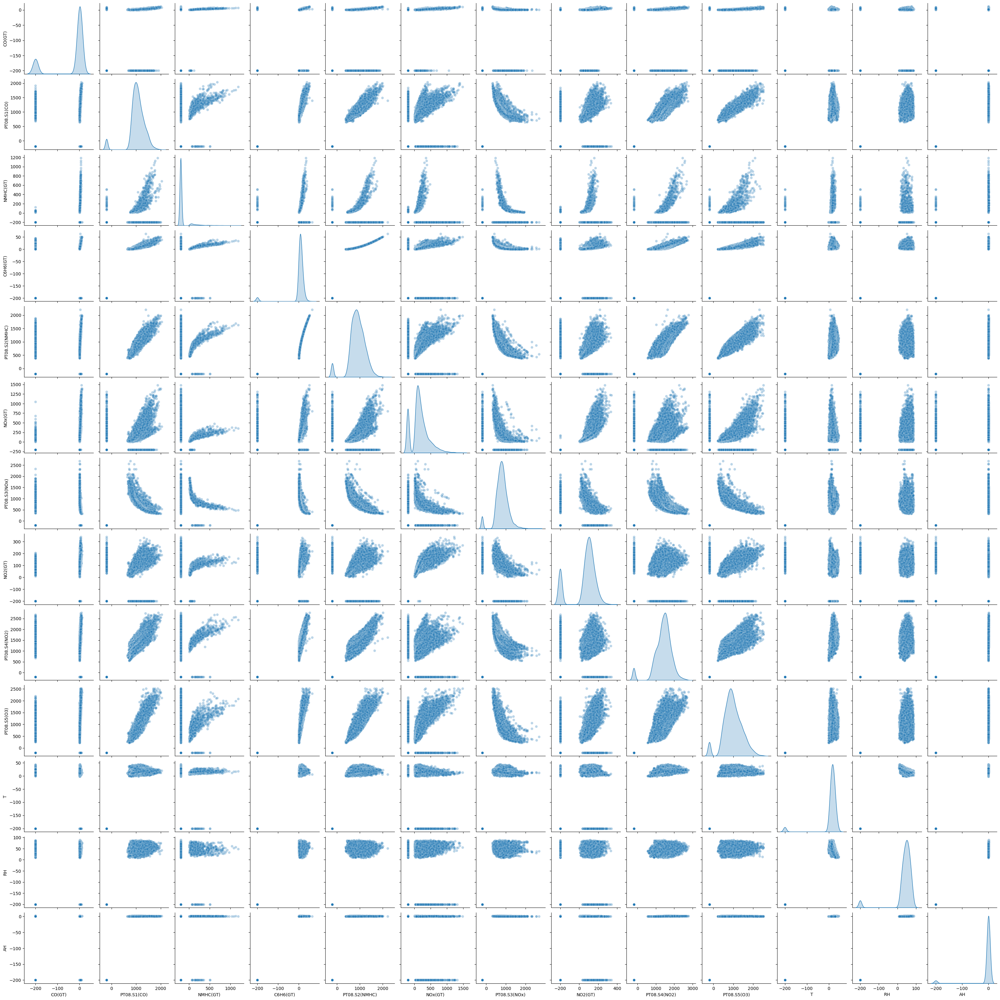

In [ ]:
sns.pairplot(columns2, plot_kws= {'alpha': 0.3}, diag_kind= 'kde')
plt.show()

**Pruebas de normalidad y QQplot para columnas numericas**

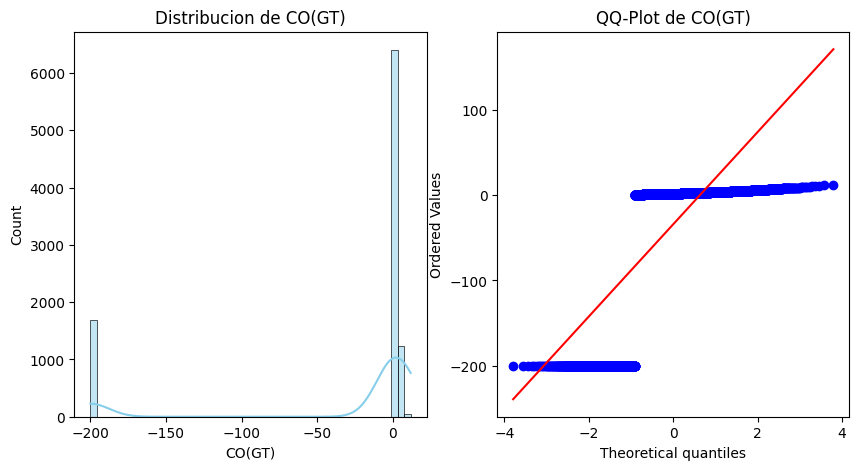


Pruebas de normalidad para la columna: CO(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 2501.15334

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


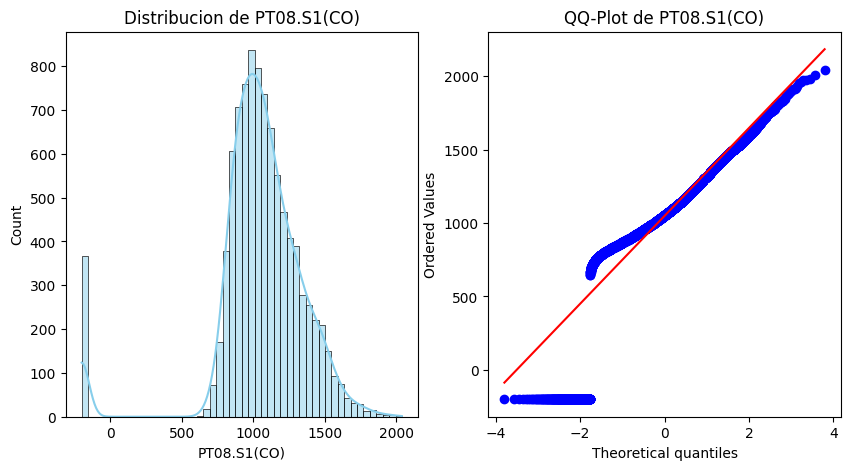


Pruebas de normalidad para la columna: PT08.S1(CO)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 355.41246

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


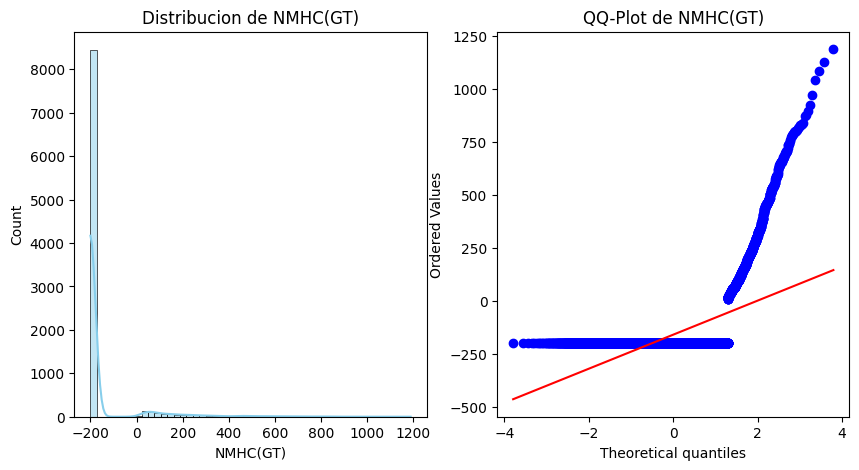


Pruebas de normalidad para la columna: NMHC(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 2820.94917

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


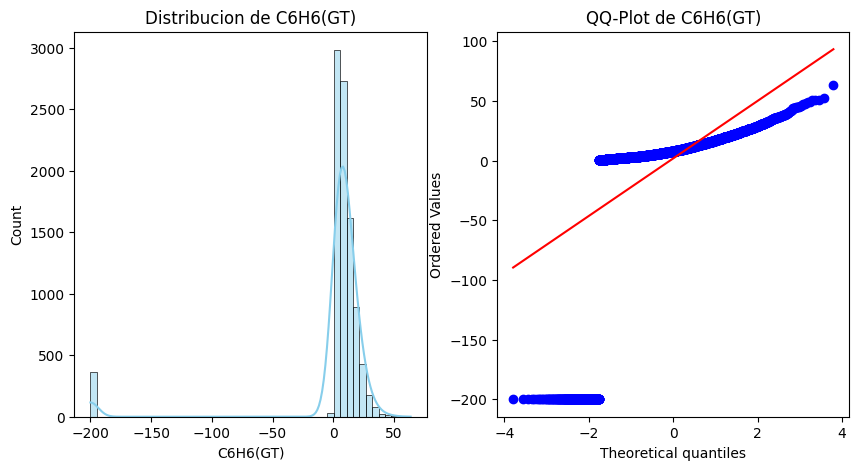


Pruebas de normalidad para la columna: C6H6(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 2272.58484

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


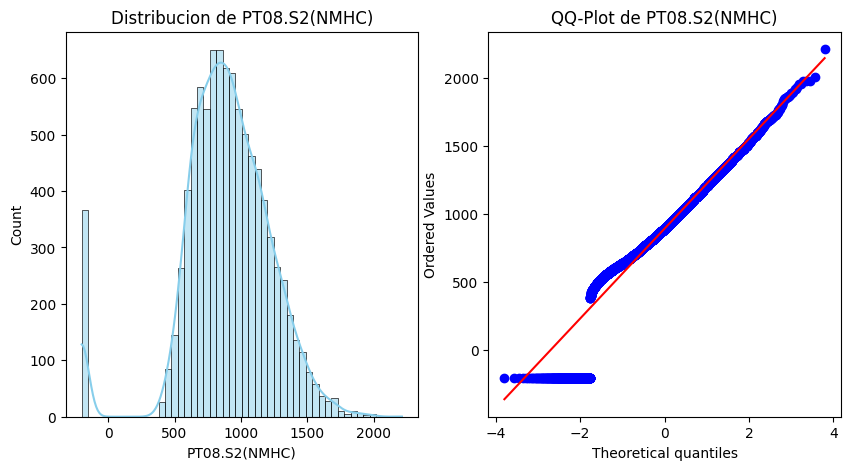


Pruebas de normalidad para la columna: PT08.S2(NMHC)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 119.20819

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


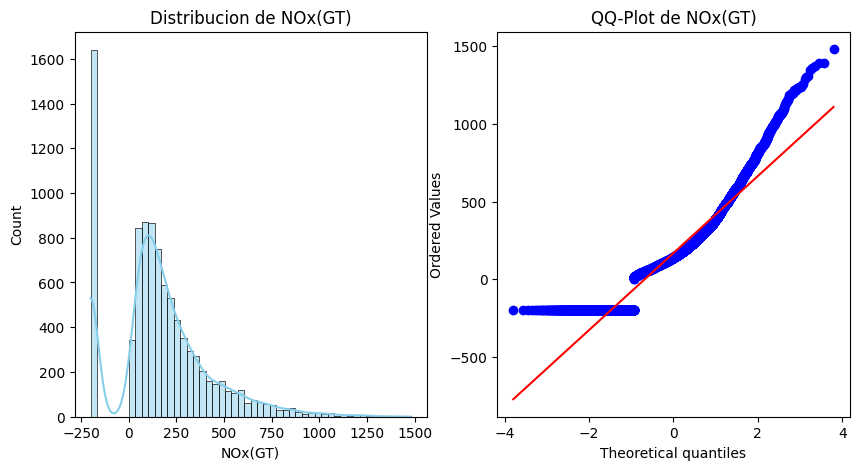


Pruebas de normalidad para la columna: NOx(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 188.79429

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


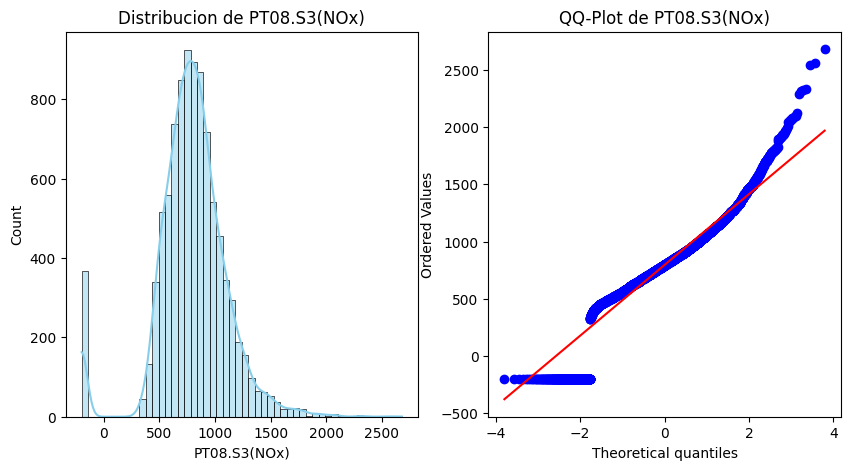


Pruebas de normalidad para la columna: PT08.S3(NOx)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 159.03112

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


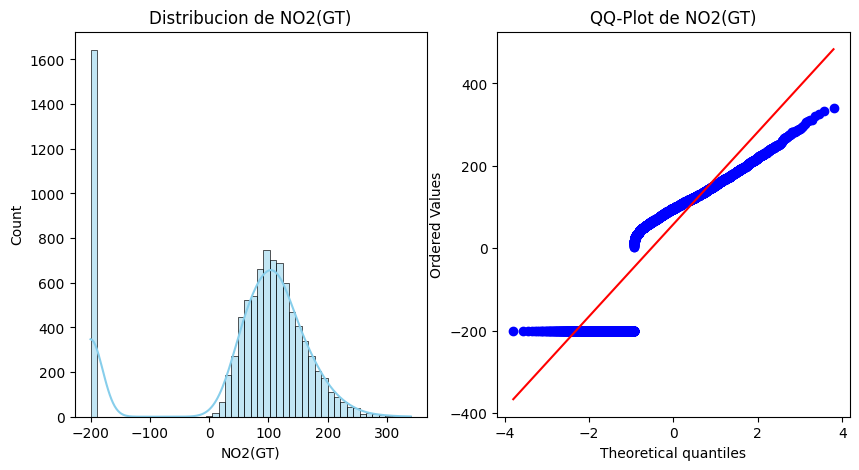


Pruebas de normalidad para la columna: NO2(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 894.66163

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


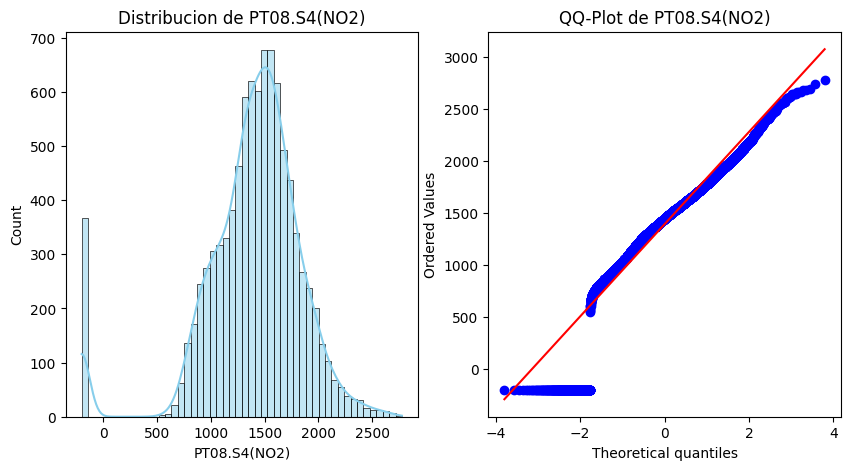


Pruebas de normalidad para la columna: PT08.S4(NO2)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 183.34158

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


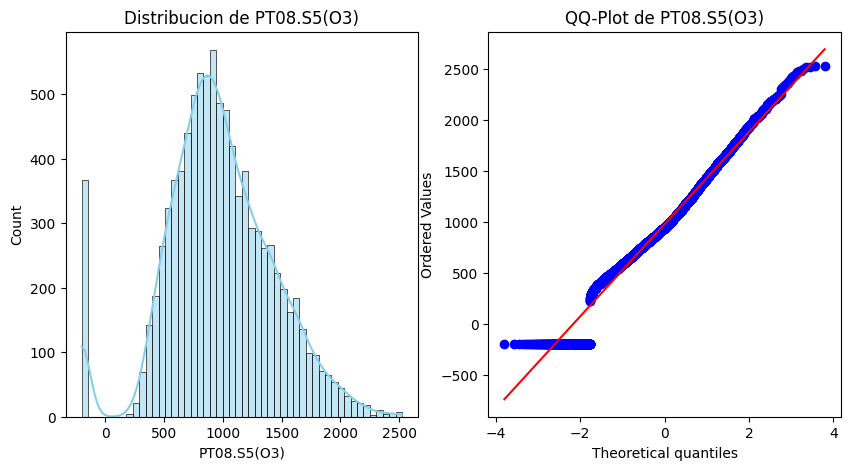


Pruebas de normalidad para la columna: PT08.S5(O3)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 45.68234

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


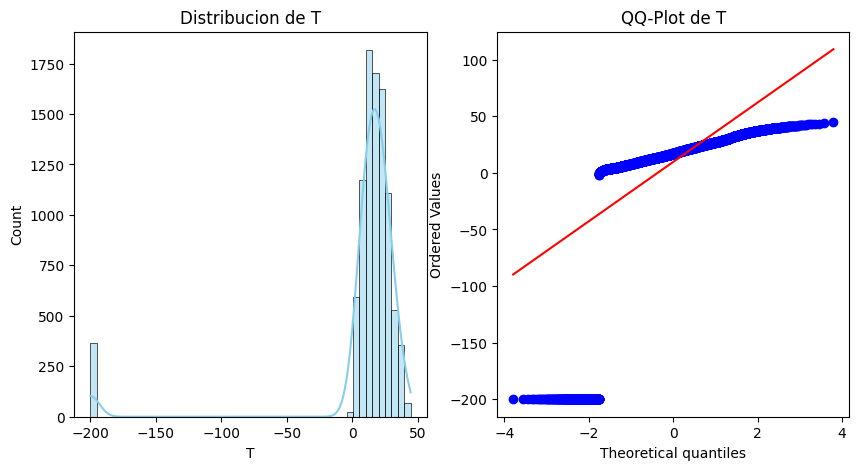


Pruebas de normalidad para la columna: T

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 2041.45858

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


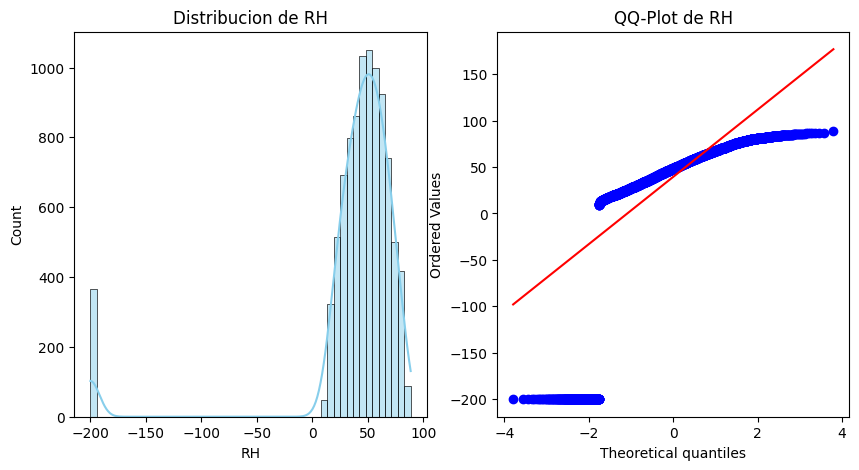


Pruebas de normalidad para la columna: RH

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 1329.04460

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


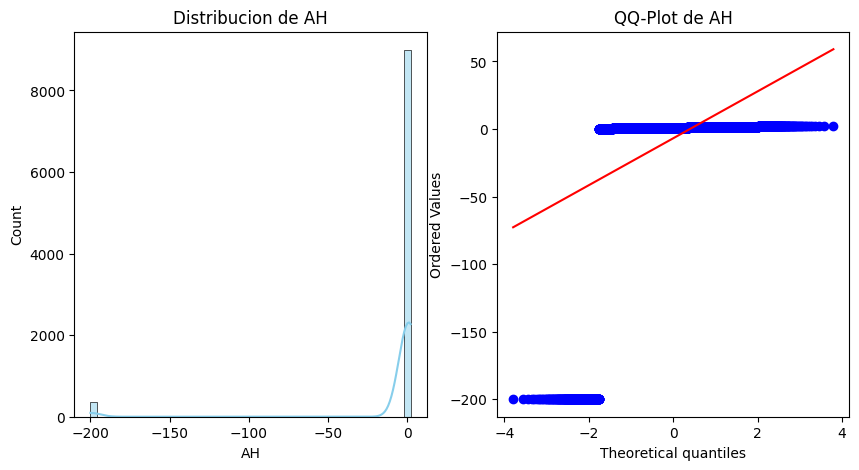


Pruebas de normalidad para la columna: AH

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 3357.68062

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


In [ ]:
### Funcion purebas de normalidad
def normality_test(data, column_name):
  print(f'\nPruebas de normalidad para la columna: {column_name}')

  ### Prueba Shapiro_wilk
  shapiro_test = stats.shapiro(data.sample(min(5000, len(data)), random_state= 42))
  print(f'\nShapiro-Wilk test: p-valor = {shapiro_test.pvalue:.5f}')

  ### Prueba de Kolmogorov_Smirnov
  ks_test = stats.kstest(data, 'norm', args= (data.mean(), data.std()))
  print(f'\nKolmogorov-Smirnov test: p-valor = {ks_test.pvalue:.5f}')

  ### Prueba de Anderson_Darling
  anderson_test = stats.anderson(data, dist= 'norm')
  print(f'\nAnderson-Darling test: Estadistico = {anderson_test.statistic:.5f}')
  for i in range(len(anderson_test.critical_values)):
    sl, cv = anderson_test.significance_level[i], anderson_test.critical_values[i]
    if anderson_test.statistic < cv:
      print(f'\nAl nivel de significancia {sl}%, los datos parecen normales.')
    else:
      print(f'\nAl nivel de significancia {sl}%, los datos NO parecen normales.')

  ### Prueba de D'Agostino-Pearson
  dagostino_test = stats.normaltest(data)
  print(f"\nD'Agistino-Pearson test: p-valor = {dagostino_test.pvalue:.5f}")

  ### Funcion para histograma y QQ-plot
def plot_distribution(data, column_name):
  plt.figure(figsize= (10,5))

  ### Histograma
  plt.subplot(1, 2, 1)
  sns.histplot(data, bins= 50, kde= True, color= 'skyblue')
  plt.title(f'Distribucion de {column_name}')

  ### QQ-plot
  plt.subplot(1, 2, 2)
  stats.probplot(data, dist= 'norm', plot= plt)
  plt.title(f'QQ-Plot de {column_name}')

  plt.show()

### Pruebas de normalidad y graficos de cada columna
for cols in columns:
  data= df[cols]
  plot_distribution(data, cols)
  normality_test(data, cols)


Comprando cambio de tipo de dato:

<class 'pandas.core.series.Series'>
RangeIndex: 9357 entries, 0 to 9356
Series name: Date
Non-Null Count  Dtype         
--------------  -----         
9357 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 73.2 KB

Frecuencia por dia:
 Day_of_week
Thursday     1344
Friday       1344
Saturday     1344
Sunday       1344
Monday       1335
Wednesday    1326
Tuesday      1320
Name: count, dtype: int64 



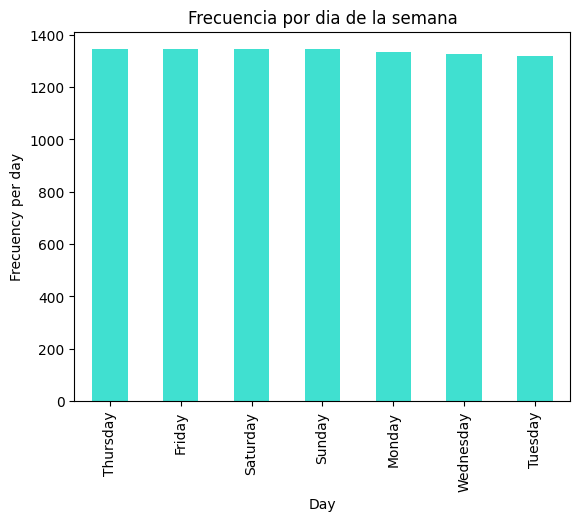

In [ ]:
### Convertir columna 'Date' de tipo object a tipo date

df['Date'] = pd.to_datetime(df['Date'], format= '%d/%m/%Y')

### Verificar correcto cambio de tipo de dato
print('Comprando cambio de tipo de dato:\n')
df['Date'].info()

### Get day
df['Day_of_week'] = df['Date'].dt.day_name()
#print('\nVista previa de columna nueva:\n',df[['Date','Day_of_week']].head())

count_days = df['Day_of_week'].value_counts()
print('\nFrecuencia por dia:\n',count_days, '\n')

count_days.plot.bar(color='turquoise')
plt.title('Frecuencia por dia de la semana')
plt.xlabel('Day')
plt.ylabel('Frecuency per day')
plt.show()

# **Identificar y tratar los datos faltantes**

Al revisar los datos podemos ver los valores -200 en varias columnas del dataset, estos datos podrian interpretarse como datos nulos por alguna falla en los sensores de medicion por ejemplo.

La dinamica para tratar estos datos sera calcular la moda de cada calumna y  sustituir ese valor donde se encuentre el -200.

In [ ]:
### Valores minimos de todas las columnas
#print(columns2)

minimos = columns2.min()
#print('Valores minimos en cada una de las columnas del dataset:\n', minimos)

### Remover valores -200 de cada columna
for i in columns2.columns:
  #print(i)
  df[i] = df[i].replace(to_replace=-200.0, value= np.nan)


minimos2 = df.min()
print('\n\nNuevos valores minimos en cada una de las columnas del dataset:\n', minimos2)


### Calculo de median para cada columna
df_median = df.select_dtypes(include= ['float64', 'int64']).median()
print('\n\nValor de la media en cada columna:\n',df_median)

### Fill nan con moda
for i in columns2.columns:
  df[i] = df[i].fillna(df[i].median())

#print(df.info())
print('\n\nDescripcion de datos despues de tratar datos faltantes:\n ',df.describe())




Nuevos valores minimos en cada una de las columnas del dataset:
 Date             01/01/2005
Time               00.00.00
CO(GT)                  0.1
PT08.S1(CO)           647.0
NMHC(GT)                7.0
C6H6(GT)                0.1
PT08.S2(NMHC)         383.0
NOx(GT)                 2.0
PT08.S3(NOx)          322.0
NO2(GT)                 2.0
PT08.S4(NO2)          551.0
PT08.S5(O3)           221.0
T                      -1.9
RH                      9.2
AH                   0.1847
dtype: object


Valor de la media en cada columna:
 CO(GT)              1.8000
PT08.S1(CO)      1063.0000
NMHC(GT)          150.0000
C6H6(GT)            8.2000
PT08.S2(NMHC)     909.0000
NOx(GT)           180.0000
PT08.S3(NOx)      806.0000
NO2(GT)           109.0000
PT08.S4(NO2)     1463.0000
PT08.S5(O3)       963.0000
T                  17.8000
RH                 49.6000
AH                  0.9954
dtype: float64


Descripcion de datos despues de tratar datos faltantes:
              CO(GT)  PT08.S1(CO)    

**Histogramas para columnas numericas despues de tratar los datos**

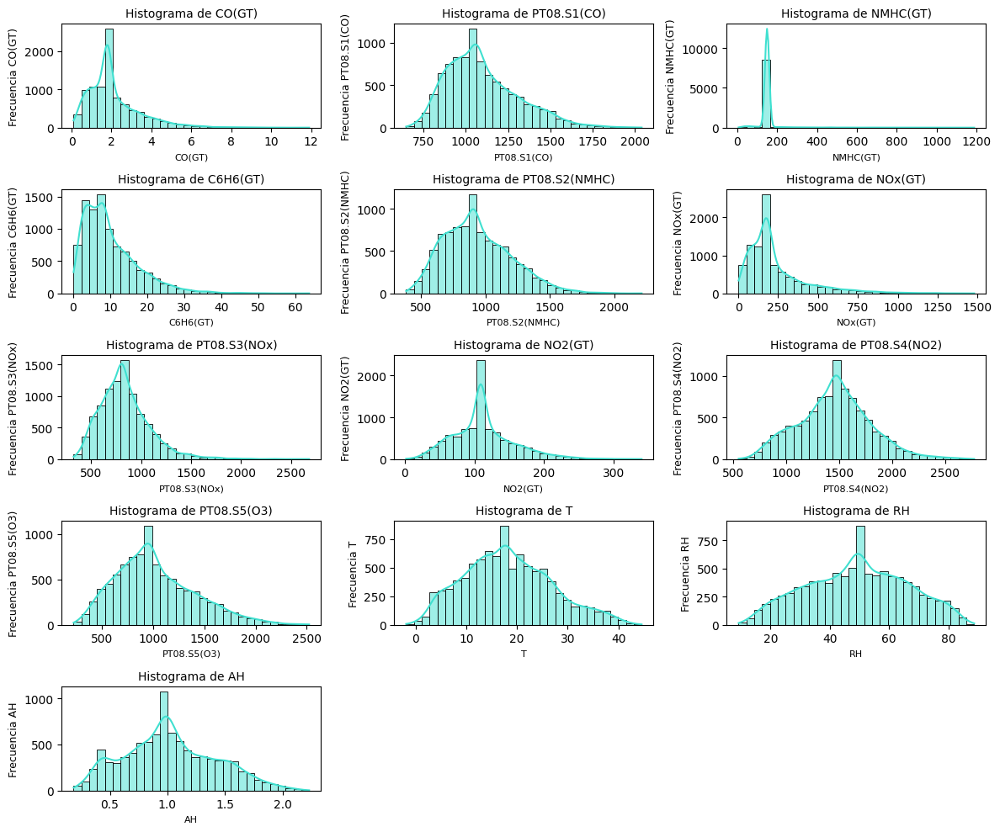

In [ ]:
columns = df.select_dtypes(include= ['int64','float64']).columns
#print(columns)

plt.figure(figsize= (12,10))

for i, col in enumerate(columns, 1):
  plt.subplot(5, 3, i)
  sns.histplot(df[col], kde= True, bins= 30, color='turquoise')
  plt.title(f'Histograma de {col}', fontsize= 10)
  plt.xlabel(col, fontsize= 8)
  plt.ylabel(f'Frecuencia {col}', fontsize= 9)

plt.tight_layout()
plt.show()


**Boxplots para identficar outliers en las columnas numericas despues de tratar datos**

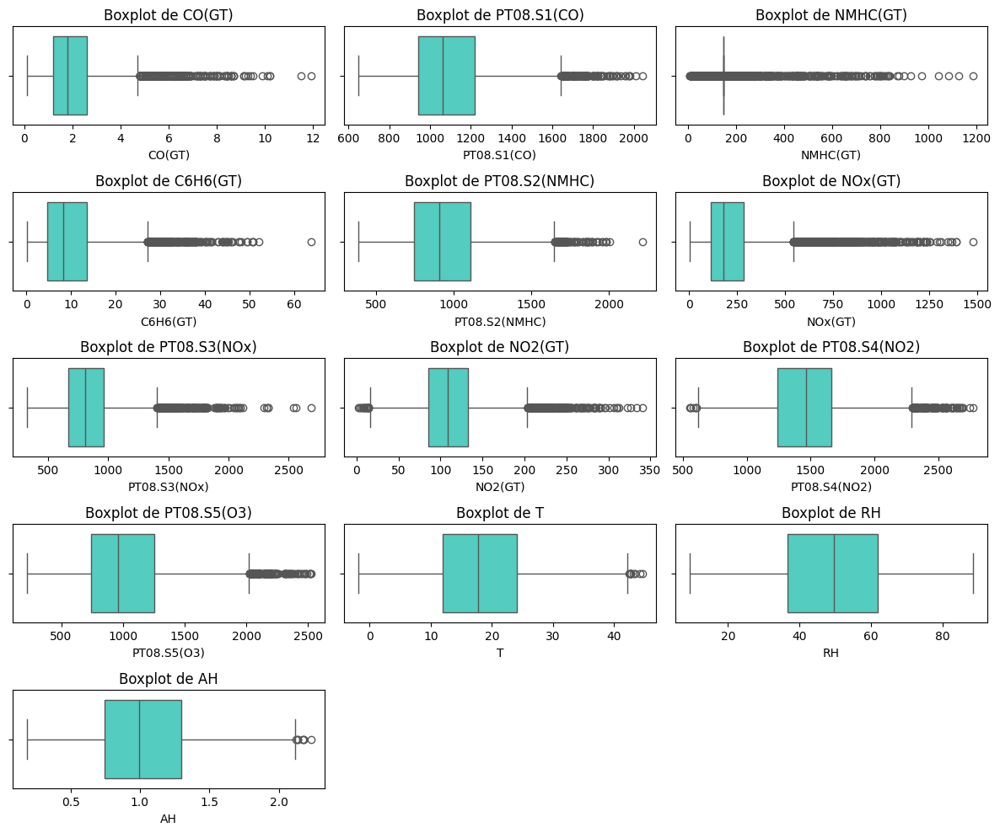

In [ ]:
plt.figure(figsize= (12,10))

for i, col in enumerate(columns, 1):
  plt.subplot(5,3,i)
  sns.boxplot(x= df[col], color='turquoise')
  plt.title(f'Boxplot de {col}')

plt.tight_layout()
plt.show()

**Matriz de correlacion y mapa de calor despues de tratar datos**


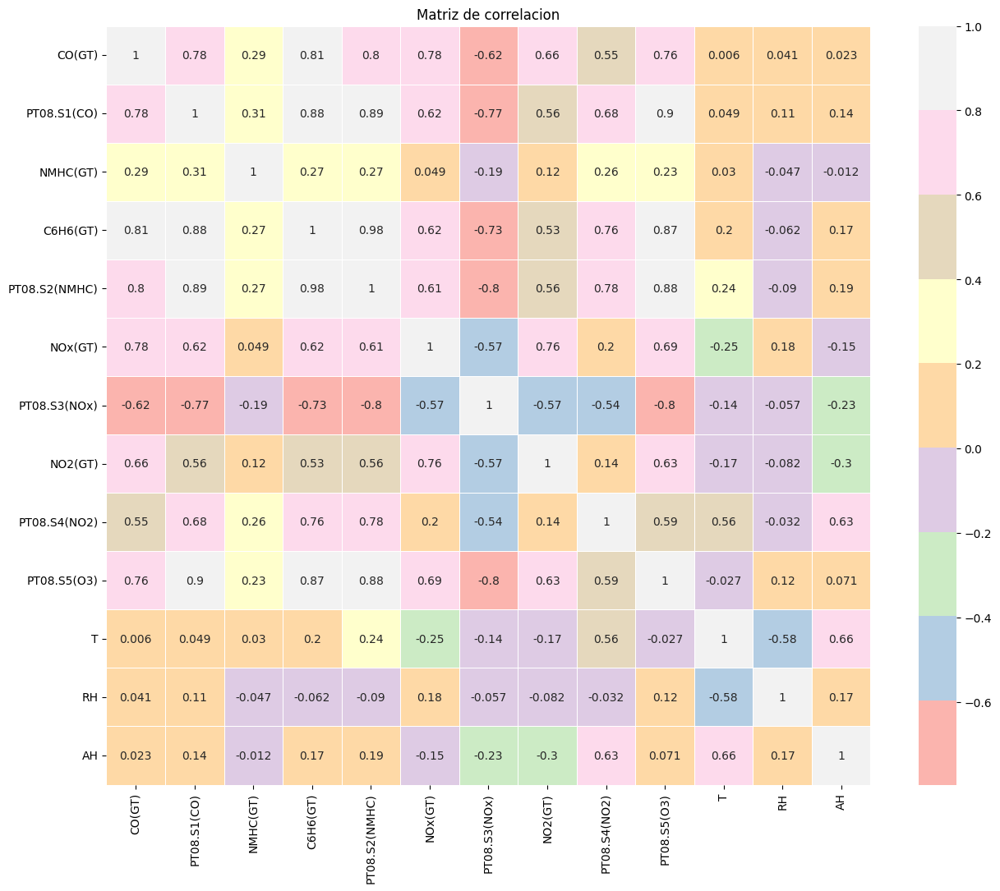

In [ ]:
columns2 = df.select_dtypes(include=[np.number])

matriz_corr = columns2.corr()

plt.figure(figsize= (15,12))
sns.heatmap(matriz_corr, annot= True, cmap= 'Pastel1', linewidths= 0.5)
plt.title('Matriz de correlacion')
plt.show()

**Pairplot para visualizar relaciones entre variables numericas despues de tratar datos**

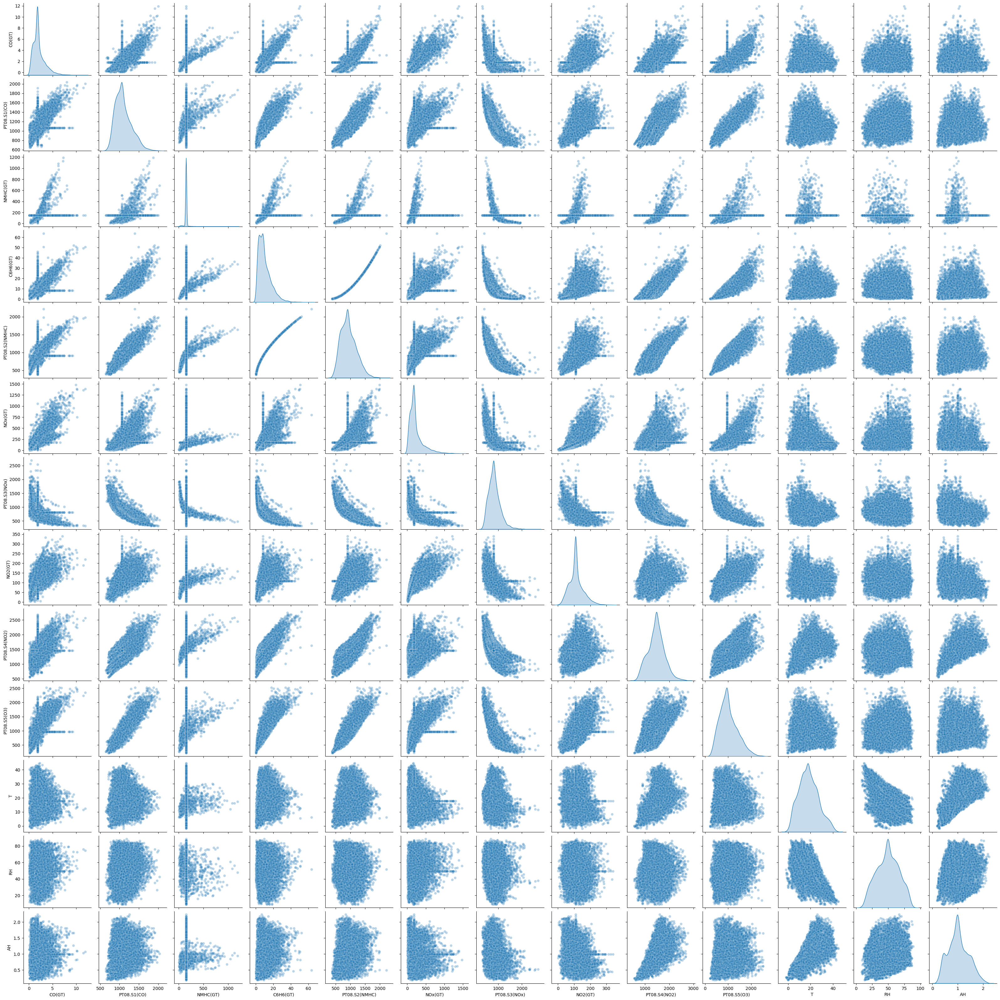

In [ ]:
sns.pairplot(columns2, plot_kws= {'alpha': 0.3}, diag_kind= 'kde')
plt.show()

**Pruebas de normalidad y QQplot para columnas numericas despues de tratar los datos**

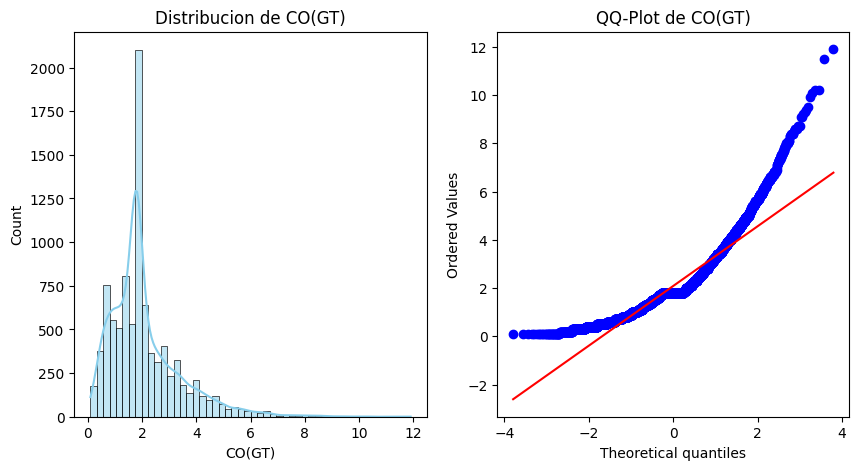


Pruebas de normalidad para la columna: CO(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 315.91164

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


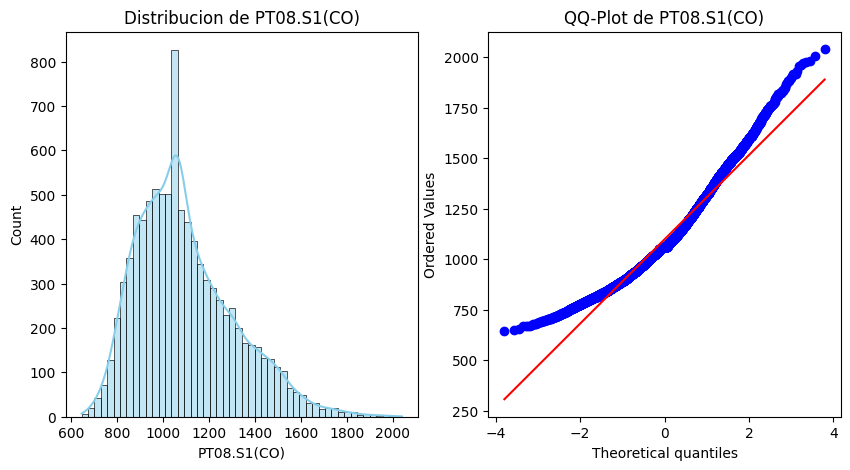


Pruebas de normalidad para la columna: PT08.S1(CO)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 103.12601

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


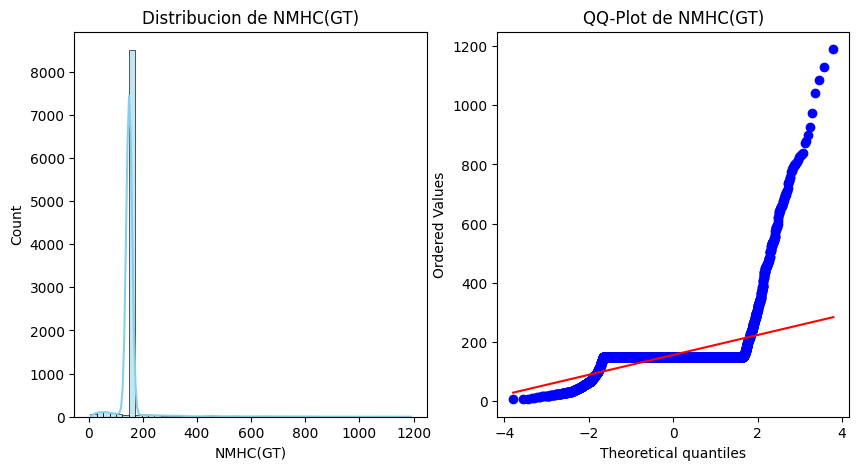


Pruebas de normalidad para la columna: NMHC(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 2808.06899

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


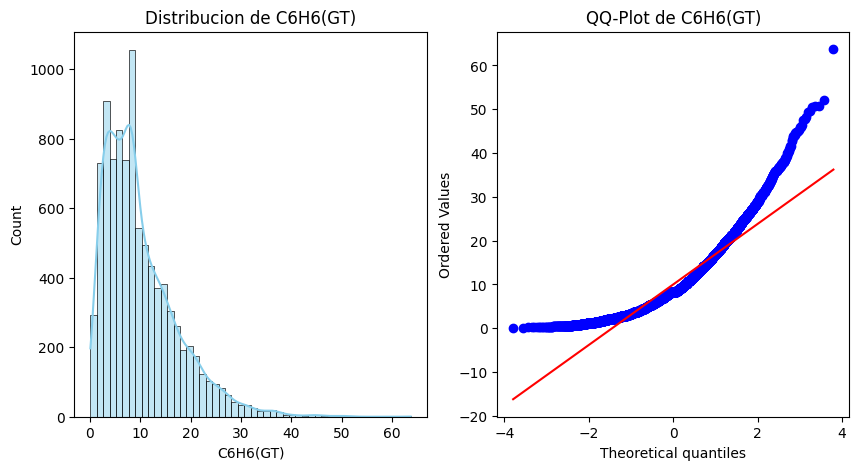


Pruebas de normalidad para la columna: C6H6(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 247.10194

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


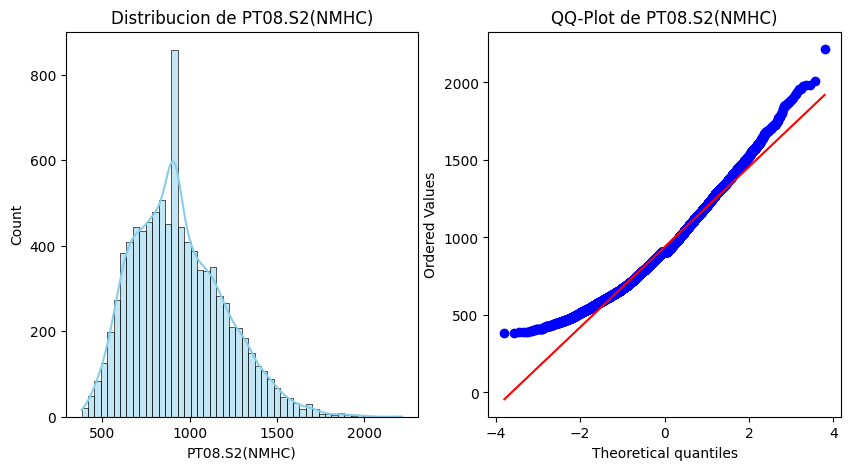


Pruebas de normalidad para la columna: PT08.S2(NMHC)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 49.71409

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


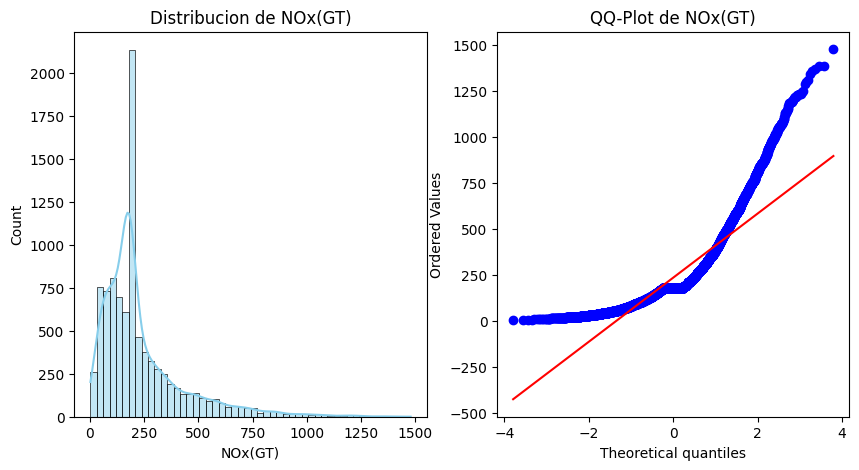


Pruebas de normalidad para la columna: NOx(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 559.57109

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


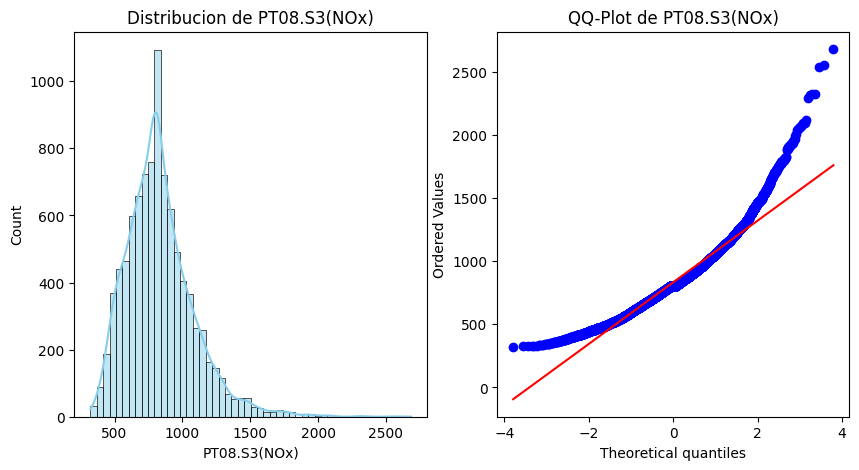


Pruebas de normalidad para la columna: PT08.S3(NOx)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 87.97310

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


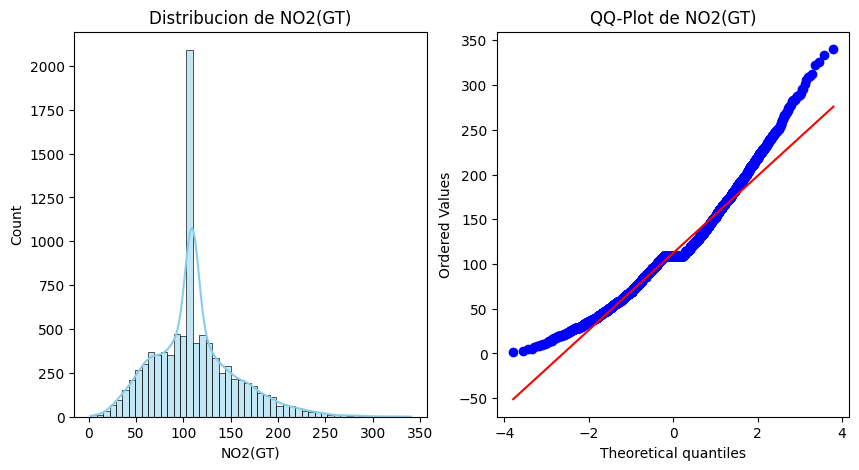


Pruebas de normalidad para la columna: NO2(GT)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 122.29970

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


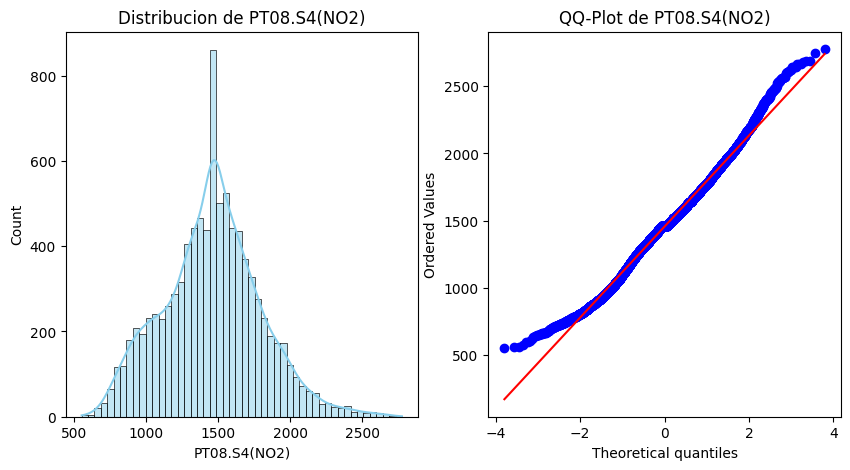


Pruebas de normalidad para la columna: PT08.S4(NO2)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 14.29705

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


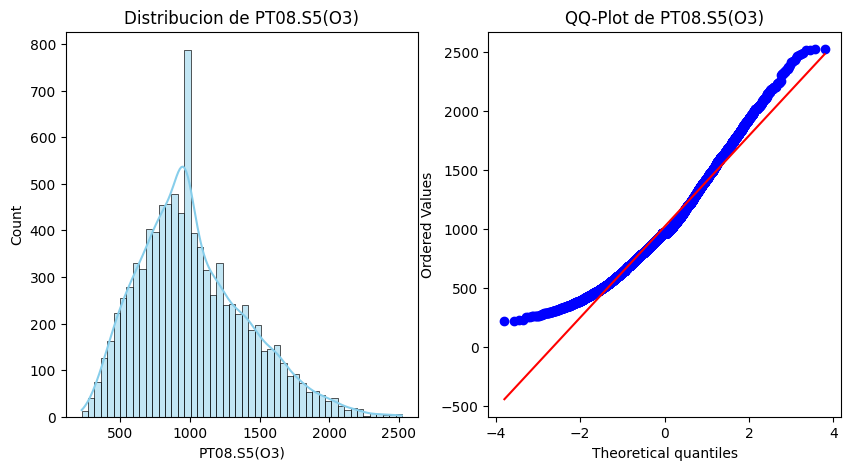


Pruebas de normalidad para la columna: PT08.S5(O3)

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 73.27645

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


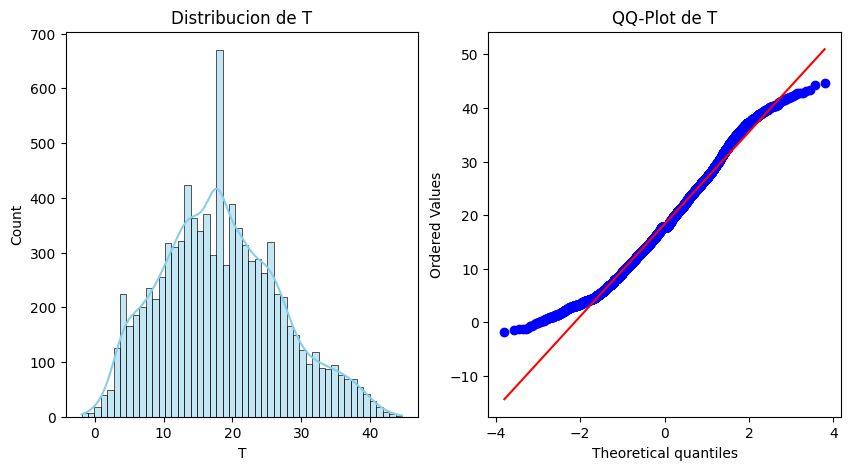


Pruebas de normalidad para la columna: T

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 21.92645

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


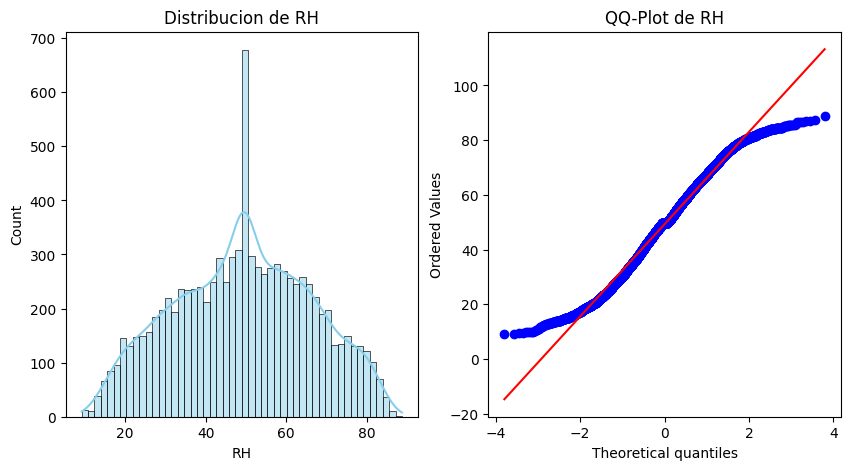


Pruebas de normalidad para la columna: RH

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 20.58979

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


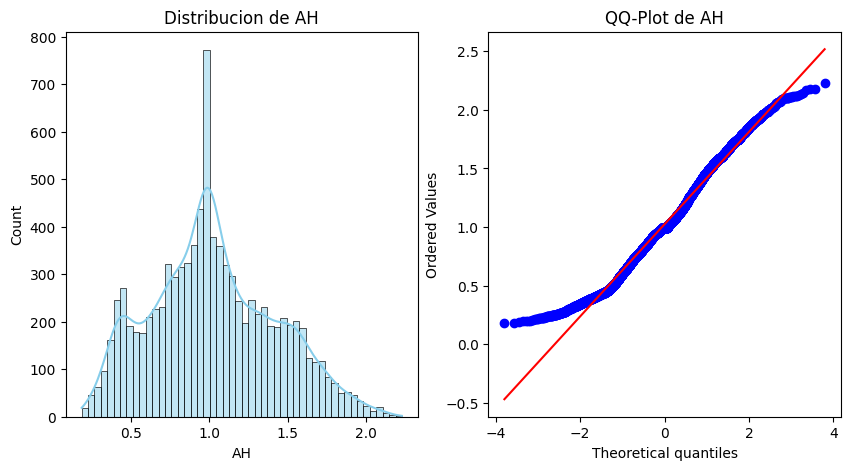


Pruebas de normalidad para la columna: AH

Shapiro-Wilk test: p-valor = 0.00000

Kolmogorov-Smirnov test: p-valor = 0.00000

Anderson-Darling test: Estadistico = 30.76443

Al nivel de significancia 15.0%, los datos NO parecen normales.

Al nivel de significancia 10.0%, los datos NO parecen normales.

Al nivel de significancia 5.0%, los datos NO parecen normales.

Al nivel de significancia 2.5%, los datos NO parecen normales.

Al nivel de significancia 1.0%, los datos NO parecen normales.

D'Agistino-Pearson test: p-valor = 0.00000


In [ ]:
### Funcion purebas de normalidad
def normality_test(data, column_name):
  print(f'\nPruebas de normalidad para la columna: {column_name}')

  ### Prueba Shapiro_wilk
  shapiro_test = stats.shapiro(data.sample(min(5000, len(data)), random_state= 42))
  print(f'\nShapiro-Wilk test: p-valor = {shapiro_test.pvalue:.5f}')

  ### Prueba de Kolmogorov_Smirnov
  ks_test = stats.kstest(data, 'norm', args= (data.mean(), data.std()))
  print(f'\nKolmogorov-Smirnov test: p-valor = {ks_test.pvalue:.5f}')

  ### Prueba de Anderson_Darling
  anderson_test = stats.anderson(data, dist= 'norm')
  print(f'\nAnderson-Darling test: Estadistico = {anderson_test.statistic:.5f}')
  for i in range(len(anderson_test.critical_values)):
    sl, cv = anderson_test.significance_level[i], anderson_test.critical_values[i]
    if anderson_test.statistic < cv:
      print(f'\nAl nivel de significancia {sl}%, los datos parecen normales.')
    else:
      print(f'\nAl nivel de significancia {sl}%, los datos NO parecen normales.')

  ### Prueba de D'Agostino-Pearson
  dagostino_test = stats.normaltest(data)
  print(f"\nD'Agistino-Pearson test: p-valor = {dagostino_test.pvalue:.5f}")

  ### Funcion para histograma y QQ-plot
def plot_distribution(data, column_name):
  plt.figure(figsize= (10,5))

  ### Histograma
  plt.subplot(1, 2, 1)
  sns.histplot(data, bins= 50, kde= True, color= 'skyblue')
  plt.title(f'Distribucion de {column_name}')

  ### QQ-plot
  plt.subplot(1, 2, 2)
  stats.probplot(data, dist= 'norm', plot= plt)
  plt.title(f'QQ-Plot de {column_name}')

  plt.show()

### Pruebas de normalidad y graficos de cada columna
for cols in columns:
  data= df[cols]
  plot_distribution(data, cols)
  normality_test(data, cols)


# **Análisis Exploratorio de Datos (EDA):**

* **¿Qué patrones o tendencias observaste en los histogramas y gráficas de densidad (PDF)? ¿Alguna variable parece seguir una distribución normal?**

  A excepción de algunas columnas como CO(GT), NMHC(GT), C6H6(GT), NO2(GT), AH las otras columnas parecían tener una distribución normal.

* **¿Qué información útil obtuviste de las gráficas de barras para las variables categóricas (por ejemplo, DayOfWeek)?**

  La captura de información fue casi igual en todos los días de la semana.

* **¿Identificaste outliers en los boxplots? ¿Cómo podrían afectar estos outliers al modelo de regresión lineal?**
  
  Varias columnas mostraron bastantes outliers en rangos muy separados. Ya que estos outliers pudieran ser datos nulos o errores en el datset no podemos asegurar que la predicción que realice el modelo de regresión lineal sea de confianza, es necesario tratar esos datos antes de aplicar el modelo.

# **Pruebas de Normalidad:**

* **¿Qué conclusiones obtuviste de las pruebas de normalidad (Shapiro-Wilk, Anderson-Darling, Kolmogorov-Smirnov)? ¿Qué variables no siguen una distribución normal?**

* **¿Cómo interpretas los QQplots? ¿Qué variables se desvían significativamente de la normalidad?**

  Al realizar las pruebas de normalidad pude ver que ninguna columna tenía un comportamiento normal las columnas PT08.S4(NO2) o PT08.S5(O3) son las que mostraron un comportamiento cercano al normal.

  Sin embargo hubo columnas que estaban lejos de seguir la línea de distribución perfecta como la columna CO(GT).

#**Tratamiento de Datos Faltantes:**

* **¿Qué estrategia utilizaste para manejar los datos faltantes? ¿Por qué elegiste esa estrategia?**

  Primeramente identifique los datos que tenían el valor “-200.0” como un error en la medición, suponiendo que se usan sensores para hacer estas mediciones y que pudieran haber tenido una falla.
  Después de identificar estos datos como datos faltantes, opte por usar media para rellenar esos valores, primero cambie los “-200.0” a “Nan”, después calcular la media con los valores que no se afectaron para posteriormente rellenar los Nan con este valor de la media.

* **¿Cómo cambió el EDA después de la imputación de datos? ¿Observaste diferencias significativas en las distribuciones de las variables?**

  Si se observaron diferencias muy grandes sobre todo en los histogramas, se pudo ver como todos los datos ahora estaban debajo de la curva. También en los QQplots se vio una mejora en los datos, siguiendo mejor la línea de distribución perfecta.

# **Matriz de Correlación y Pairplot:**

¿Qué relaciones lineales identificaste en la matriz de correlación y el pairplot? ¿Alguna variable tiene una correlación fuerte con la variable objetivo?

¿Cómo podrías utilizar esta información para seleccionar características (features) en un modelo de regresión lineal?